<a href="https://www.kaggle.com/kalilurrahman/starbucks-stock-price-performance-analysis?scriptVersionId=89682937" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import warnings
warnings.filterwarnings('ignore')
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/starbucks-stock-data-live-and-latest/Starbucks_stock_action.csv
/kaggle/input/starbucks-stock-data-live-and-latest/Starbucks_stock_history.csv
/kaggle/input/starbucks-stock-data-live-and-latest/Starbucks_stock_info.csv


# [🔮🎯📊 Starbucks Stock Price Performance Analysis and Data Visualization 📊🎯🔮](#0)


 *  Task-1 Dataset Load  
 *  Task-2 Data Visualization Charts  
 *  Task-3 Statistical Analysis and Inference  
 *  Task-4 Linear Regression and Forecasting 


<a id=1><h3 >1️⃣ Dataset Loading<br></h3></a>
<a id=2><h3 >2️⃣ Dataset Visualization Using Simple Plots<br></h3></a>
<a id=3><h3 >3️⃣ Dataset Visualization Using MPLFinance Plots<br></h3></a>
<a id=4><h3 >4️⃣ Stock Analysis of the data<br></h3></a>
<a id=4.1><h4 >4️⃣.1️⃣ MACD Forecasting of data using Pandas TA<br></h4></a>
<a id=5><h3 >5️⃣ Let us do a financial ratios calculation using FINTA library <br></h3></a>
<a id=6><h3 >6️⃣ Let us do a financial ratios calculation<br></h3></a>
<a id=7><h3 >7️⃣ Let us do a bit of forecasting using Facebook Prophet Regression <br></h3></a>
<a id=8><h3 >8️⃣ Let us do a Facebook Prophet library<br></h3></a>
<a id=9><h3 >9️⃣ Let us do a Forecasting using PyCaret<br></h3></a>


In [2]:

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
from matplotlib import style
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader

# For time stamps
from datetime import datetime
from math import sqrt

#ignore the warnings
import warnings
warnings.filterwarnings('ignore')


try:
    import mplfinance as mpf
    import mpl_finance as mplf
    from mpl_finance import candlestick_ohlc
except:
    !pip install mplfinance mpl_finance
    import mplfinance as mpf
    import mpl_finance as mplf
    from mpl_finance import candlestick_ohlc

     |████████████████████████████████| 70 kB 620 kB/s 


/opt/conda/lib/python3.7/site-packages/mpl_finance.py:22: DeprecationWarning: 



    Please use `mplfinance` instead (no hyphen, no underscore).

    To install: `pip install --upgrade mplfinance` 

   For more information, see: https://pypi.org/project/mplfinance/


  category=DeprecationWarning)


# [1️⃣. Dataset Loading](#1)>

In [3]:
sbux = pd.read_csv('../input/starbucks-stock-data-live-and-latest/Starbucks_stock_history.csv')
sbux_info =  pd.read_csv('../input/starbucks-stock-data-live-and-latest/Starbucks_stock_info.csv', 
                         header=None, 
                         names=(['Description','Information']))
#sbux_info.dropna()
sbux_info.drop(sbux_info.loc[sbux_info['Information']=='nan'].index, inplace=True)
s = sbux_info.sort_values('Information').style
s

,Description,Information
48,gmtOffSetMilliseconds,-14400000
65,bookValue,-5.768
76,heldPercentInsiders,0.00169
99,shortPercentOfFloat,0.0093
67,sharesPercentSharesOut,0.0093
107,trailingAnnualDividendYield,0.01631765
146,dividendYield,0.0174
28,returnOnAssets,0.0845
14,profitMargins,0.104270004
18,operatingMargins,0.14613


# [2️⃣. Dataset Visualization Using Simple Plots](#2)


## Initial simple plots using 
* *Pandas Plotting for opening and closing prices*
* *Plotly OHLC (Open-High-Low-Close) Charts*
* *Statistical Moving Average (SMA) Charts*
* *Exponential Moving Average (EMA) Charts*


#### Simple Pandas plots for the price and volume of Starbucks Stock

<AxesSubplot:>

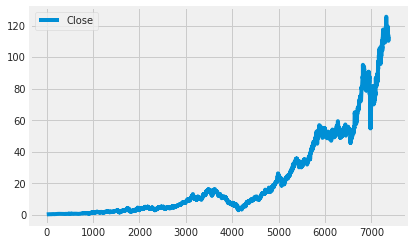

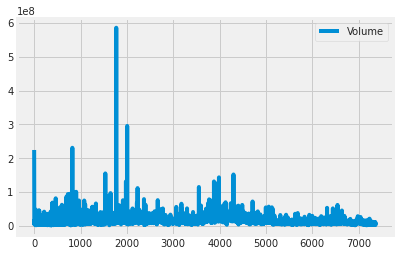

In [4]:
#Closing Price PLot
sbux[["Close"]].plot()
#Volume Plot
sbux[["Volume"]].plot()

### CAGR Compound Annual Growth Rate (CAGR)

In [5]:
sbux2 = pd.read_csv('../input/starbucks-stock-data-live-and-latest/Starbucks_stock_history.csv', header=0, 
                  index_col= 0, names=['Date','Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Splits'], parse_dates=True)
# Get the number of days in `sbux`
days = (sbux2.index[-1] - sbux2.index[0]).days

# Calculate the CAGR 
cagr = ((((sbux2['Close'][-1]) / sbux2['Close'][1])) ** (365.0/days)) - 1


# Print CAGR
print("The CAGR (Compound Annual Growth Rate) of Starbucks since IPO is " , round((cagr*100),2), "% per year")

The CAGR (Compound Annual Growth Rate) of Starbucks since IPO is  22.49 % per year


### Moving Windows


In [6]:
# Isolate the adjusted closing prices 
adj_close_px = sbux2['Close']

# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]

Date
2021-09-20    117.387744
2021-09-21    117.053929
2021-09-22    116.742111
2021-09-23    116.547193
2021-09-24    116.352272
2021-09-27    116.170259
2021-09-28    115.965394
2021-09-29    115.802909
2021-09-30    115.615838
2021-10-01    115.474593
Name: Close, dtype: float64

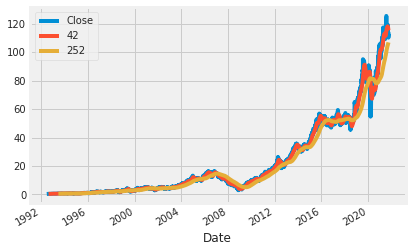

In [7]:
# Short moving window rolling mean
sbux2['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean
sbux2['252'] = adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price, the short and long windows of rolling means
sbux2[['Close', '42', '252']].plot()

plt.show()

#### OHLC Chart

In [8]:
#OHLC Plot using Plotly
import plotly.graph_objects as go

fig = go.Figure(data=go.Ohlc(x=sbux['Date'],
        open=sbux['Open'],
        high=sbux['High'],
        low=sbux['Low'],
        close=sbux['Close']))
fig.show()

### Volatility Calculation

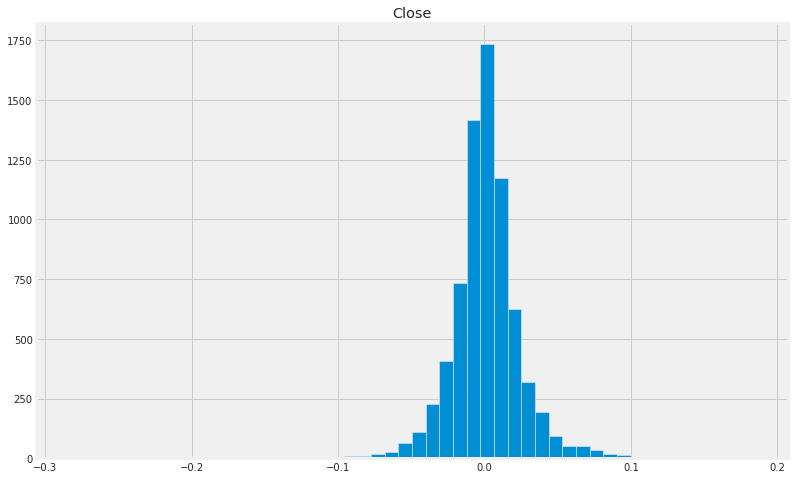

In [9]:
daily_close_px = sbux2[['Close']]
# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

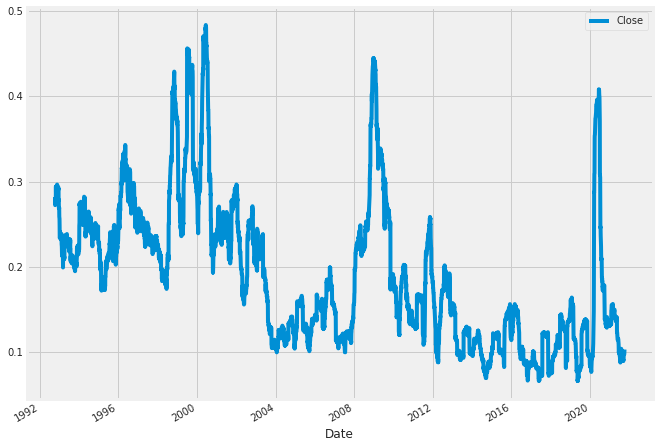

In [10]:
# Define the minumum of periods to consider 
min_periods = 75 

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods) 

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

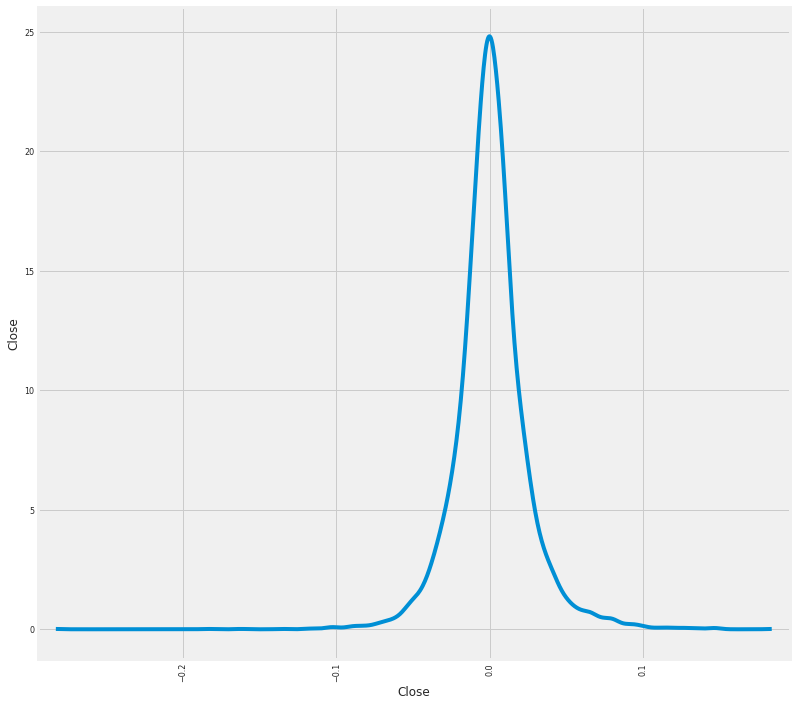

In [11]:
# Plot a scatter matrix with the `daily_pct_change` data 
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

#### SMA chart plotting for 5, 20, 50, 200, 500 day moving averages

In [12]:
sbux['SMA5'] = sbux.Close.rolling(5).mean()
sbux['SMA20'] = sbux.Close.rolling(20).mean()
sbux['SMA50'] = sbux.Close.rolling(50).mean()
sbux['SMA200'] = sbux.Close.rolling(200).mean()
sbux['SMA500'] = sbux.Close.rolling(500).mean()

fig = go.Figure(data=[go.Ohlc(x=sbux['Date'],
                              open=sbux['Open'],
                              high=sbux['High'],
                              low=sbux['Low'],
                              close=sbux['Close'], name = "OHLC"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA5, line=dict(color='orange', width=1), name="SMA5"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA20, line=dict(color='green', width=1), name="SMA20"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA50, line=dict(color='blue', width=1), name="SMA50"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA200, line=dict(color='violet', width=1), name="SMA200"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA500, line=dict(color='purple', width=1), name="SMA500")])
fig.show()

#### EMA chart plotting for 5, 20, 50, 200, 500 day moving averages

In [13]:

sbux['EMA5'] = sbux.Close.ewm(span=5, adjust=False).mean()
sbux['EMA20'] = sbux.Close.ewm(span=20, adjust=False).mean()
sbux['EMA50'] = sbux.Close.ewm(span=50, adjust=False).mean()
sbux['EMA200'] = sbux.Close.ewm(span=200, adjust=False).mean()
sbux['EMA500'] = sbux.Close.ewm(span=500, adjust=False).mean()

fig = go.Figure(data=[go.Ohlc(x=sbux['Date'],
                              open=sbux['Open'],
                              high=sbux['High'],
                              low=sbux['Low'],
                              close=sbux['Close'], name = "OHLC"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA5, line=dict(color='orange', width=1), name="EMA5"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA20, line=dict(color='green', width=1), name="EMA20"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA50, line=dict(color='blue', width=1), name="EMA50"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA200, line=dict(color='violet', width=1), name="EMA200"),
                      go.Scatter(x=sbux.Date, y=sbux.SMA500, line=dict(color='purple', width=1), name="EMA500")])
fig.show()

#### Reset the index on to the Date column

In [14]:
sbux.set_index('Date')

,Open,High,Low,Close,Volume,Dividends,Stock Splits,SMA5,SMA20,SMA50,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500
Date,,,,,,,,,,,,,,,,,
1992-06-26,0.270957,0.287086,0.264507,0.277409,224358400,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.277409,0.277409,0.277409,0.277409,0.277409
1992-06-29,0.280635,0.303215,0.274183,0.296763,58732800,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.283861,0.279252,0.278168,0.277602,0.277487
1992-06-30,0.303215,0.306440,0.283860,0.287086,34777600,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.284936,0.279999,0.278518,0.277696,0.277525
1992-07-01,0.290312,0.296763,0.280635,0.293538,18316800,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.287803,0.281288,0.279107,0.277854,0.277589
1992-07-02,0.296763,0.296763,0.287086,0.293538,13996800,0.0,0.0,0.289667,NaN,NaN,NaN,NaN,0.289714,0.282455,0.279673,0.278010,0.277652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,113.610001,114.669998,112.910004,113.680000,3988800,0.0,0.0,113.444000,115.8435,117.220352,110.545562,92.398329,113.758481,115.115722,115.771680,109.209779,96.111184
2021-09-28,112.680000,113.000000,111.080002,111.709999,5917700,0.0,0.0,113.342000,115.6485,117.157070,110.583496,92.458641,113.075654,114.791367,115.612398,109.234657,96.173455
2021-09-29,111.900002,112.519997,111.570000,112.169998,4389100,0.0,0.0,113.162000,115.3825,117.061149,110.635536,92.517465,112.773769,114.541713,115.477402,109.263864,96.237313


#### Create a column on daily change percentages for the Stock

In [15]:
sbux['daily_change_pct'] = sbux['Close'].pct_change()*100
sbux['returns'] = sbux['daily_change_pct'] / sbux['Close']  
sbux.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,SMA5,SMA20,SMA50,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500,daily_change_pct,returns
0,1992-06-26,0.270957,0.287086,0.264507,0.277409,224358400,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.277409,0.277409,0.277409,0.277409,0.277409,NaN,NaN
1,1992-06-29,0.280635,0.303215,0.274183,0.296763,58732800,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.283861,0.279252,0.278168,0.277602,0.277487,6.976593,23.508973
2,1992-06-30,0.303215,0.306440,0.283860,0.287086,34777600,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.284936,0.279999,0.278518,0.277696,0.277525,-3.260929,-11.358728
3,1992-07-01,0.290312,0.296763,0.280635,0.293538,18316800,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.287803,0.281288,0.279107,0.277854,0.277589,2.247327,7.656012
4,1992-07-02,0.296763,0.296763,0.287086,0.293538,13996800,0.0,0.0,0.289667,NaN,NaN,NaN,NaN,0.289714,0.282455,0.279673,0.278010,0.277652,0.000000,0.000000


#### Create a histogram on the daily changes / percentage

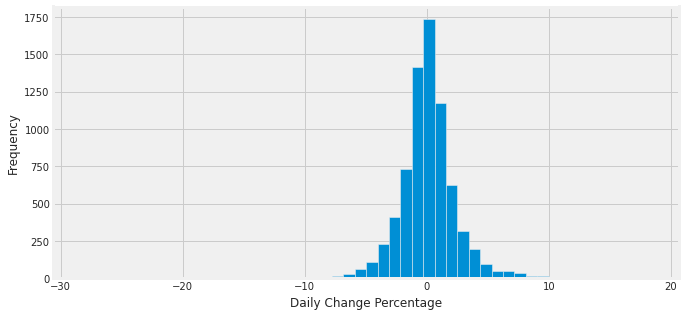

count    7371.000000
mean        0.110378
std         2.402645
min       -28.286205
25%        -1.039634
50%         0.000000
75%         1.139283
max        18.379875
Name: daily_change_pct, dtype: float64

In [16]:
sbux['daily_change_pct'].fillna(0)
sbux['daily_change_pct'].hist(bins = 50, figsize = (10,5)) 
plt.xlabel('Daily Change Percentage')
plt.ylabel('Frequency')
plt.show()
#print the statistics on daily change percentage
sbux.daily_change_pct.describe()

#### Plot 7-day rolling averages for volume of stocks traded

<AxesSubplot:>

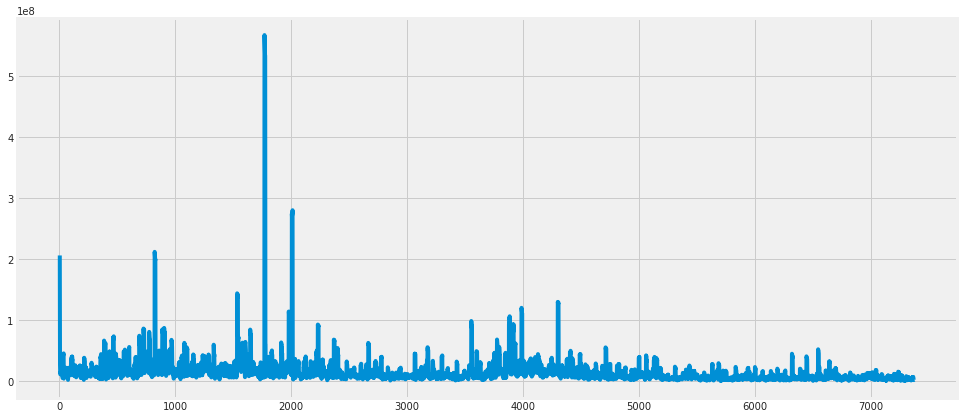

In [17]:
sbux_vol = sbux['Volume'].rolling(7).std()*np.sqrt(7)
sbux_vol.plot(figsize = (15, 7))

#### Define a daily trend function for usage in aggregation

In [18]:
def daily_trend(x):
    if x > -0.5 and x <= 0.5:
        return 'No change'
    elif x > 0.5 and x <= 2:
        return 'Upto 2% Increase'
    elif x > -2 and x <= -0.5:
        return 'Upto 2% Decrease'
    elif x > 2 and x <= 5:
        return '2-5% Increase'
    elif x > -5 and x <= -2:
        return '2-5% Decrease'
    elif x > 5 and x <= 10:
        return '5-10% Increase'
    elif x > -10 and x <= -5:
        return '5-10% Decrease'
    elif x > 10:
        return '>10% Increase'
    elif x <= -10:
        return '>10% Decrease'

#### SMA chart plotting for 5, 20, 50, 200, 500 day moving averages

In [19]:
sbux['Trend']= np.zeros(sbux['daily_change_pct'].count()+1)
sbux['Trend']= sbux['daily_change_pct'].apply(lambda x:daily_trend(x))
sbux['Trend'].replace('None','No change')
sbux.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,SMA5,SMA20,...,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500,daily_change_pct,returns,Trend
0,1992-06-26,0.270957,0.287086,0.264507,0.277409,224358400,0.0,0.0,NaN,NaN,...,NaN,NaN,0.277409,0.277409,0.277409,0.277409,0.277409,NaN,NaN,None
1,1992-06-29,0.280635,0.303215,0.274183,0.296763,58732800,0.0,0.0,NaN,NaN,...,NaN,NaN,0.283861,0.279252,0.278168,0.277602,0.277487,6.976593,23.508973,5-10% Increase
2,1992-06-30,0.303215,0.306440,0.283860,0.287086,34777600,0.0,0.0,NaN,NaN,...,NaN,NaN,0.284936,0.279999,0.278518,0.277696,0.277525,-3.260929,-11.358728,2-5% Decrease
3,1992-07-01,0.290312,0.296763,0.280635,0.293538,18316800,0.0,0.0,NaN,NaN,...,NaN,NaN,0.287803,0.281288,0.279107,0.277854,0.277589,2.247327,7.656012,2-5% Increase
4,1992-07-02,0.296763,0.296763,0.287086,0.293538,13996800,0.0,0.0,0.289667,NaN,...,NaN,NaN,0.289714,0.282455,0.279673,0.278010,0.277652,0.000000,0.000000,No change


#### A Pie & Bar Chart of Daily Percentage change categories

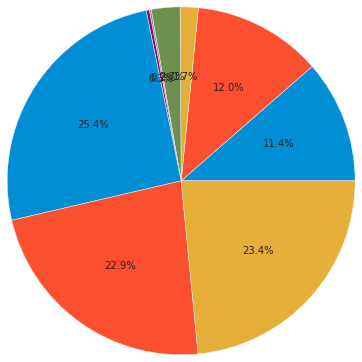

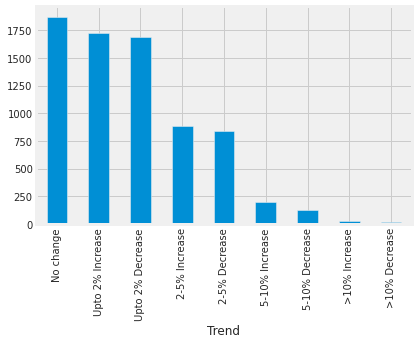

In [20]:

sbux_pie_data = sbux.groupby('Trend')
#pie_label = sbux_pie_data['Trend'].unique()
plt.pie(sbux_pie_data['Trend'].count(), #labels = pie_label, 
        autopct = '%1.1f%%', radius = 2 )
plt.show()
ax=sbux_pie_data['Trend'].count().sort_values(ascending=False).plot.bar(rot=90)
plt.show()

# [3️⃣. Dataset Visualization Using MPLFinance Plots](#3)


#### General MPLFinance Plot

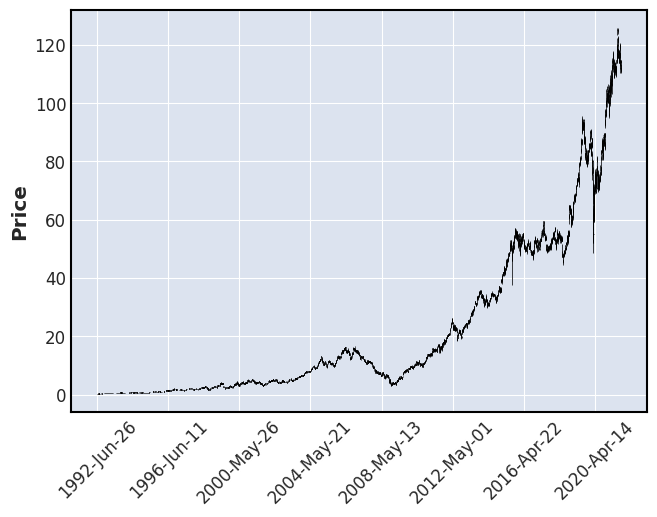

In [21]:
sbux.index = pd.DatetimeIndex(sbux['Date'])
mpf.plot(sbux)

#### CandleStick MPLFinance plot with Moving Averages for (7, 30, 90, 180, 365) days 

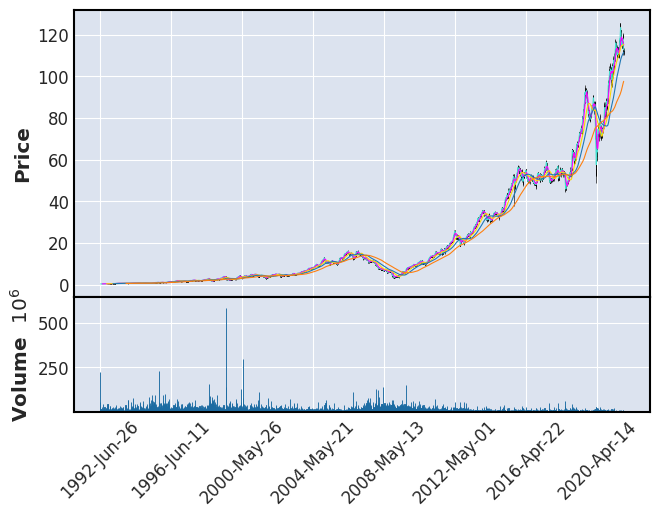

In [22]:
mpf.plot(sbux, type='candle', mav = (7, 30, 90, 180, 365), volume = True)

#### Another Candle Stick Plot with Moving Averages and show of non trading days

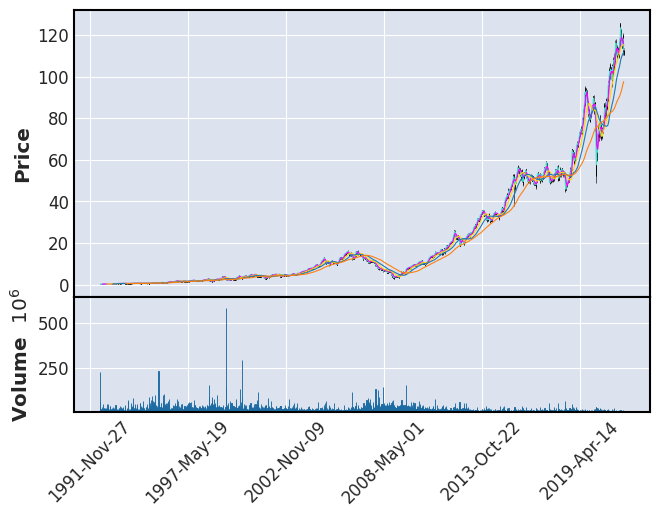

In [23]:
mpf.plot(sbux, type='candle', mav = (7, 30, 90, 180, 365), volume = True , show_nontrading = True)

In [24]:
sbux.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,SMA5,SMA20,...,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500,daily_change_pct,returns,Trend
Date,,,,,,,,,,,,,,,,,,,,,
1992-06-26,1992-06-26,0.270957,0.287086,0.264507,0.277409,224358400,0.0,0.0,NaN,NaN,...,NaN,NaN,0.277409,0.277409,0.277409,0.277409,0.277409,NaN,NaN,None
1992-06-29,1992-06-29,0.280635,0.303215,0.274183,0.296763,58732800,0.0,0.0,NaN,NaN,...,NaN,NaN,0.283861,0.279252,0.278168,0.277602,0.277487,6.976593,23.508973,5-10% Increase
1992-06-30,1992-06-30,0.303215,0.306440,0.283860,0.287086,34777600,0.0,0.0,NaN,NaN,...,NaN,NaN,0.284936,0.279999,0.278518,0.277696,0.277525,-3.260929,-11.358728,2-5% Decrease
1992-07-01,1992-07-01,0.290312,0.296763,0.280635,0.293538,18316800,0.0,0.0,NaN,NaN,...,NaN,NaN,0.287803,0.281288,0.279107,0.277854,0.277589,2.247327,7.656012,2-5% Increase
1992-07-02,1992-07-02,0.296763,0.296763,0.287086,0.293538,13996800,0.0,0.0,0.289667,NaN,...,NaN,NaN,0.289714,0.282455,0.279673,0.278010,0.277652,0.000000,0.000000,No change


# [4️⃣. Stock Data Analysis using standard techniques](#4)


###### Following is a reuse from the kernel https://www.kaggle.com/datapple/eda-tesla-stock-price-financial-analysis and modified for the analysis

#### Identify the days where the SMA20 is greater than SMA50 and tag the dates.These are target investment dates

In [25]:
sbux['Shares'] = [1 if sbux.loc[ei, 'SMA20']>sbux.loc[ei, 'SMA50'] else 0 for ei in sbux.index]

### Tag the dates as profit when the closing price is greater than the preceding date 

#### Plot the dates of wealth generation over the years

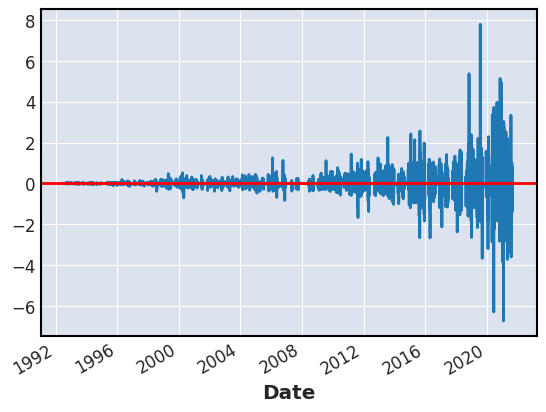

In [26]:
sbux['Close1'] = sbux['Close'].shift(-1)
sbux['Profit'] = [sbux.loc[ei, 'Close1'] - sbux.loc[ei, 'Close'] if sbux.loc[ei, 'Shares']==1 else 0 for ei in sbux.index]
sbux['Profit'].plot()
plt.axhline(y=0, color='red')

#### Calculate the cumulated wealth on the stock

In [27]:
sbux['wealth'] = sbux['Profit'].cumsum()
sbux.tail()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,SMA5,SMA20,...,EMA50,EMA200,EMA500,daily_change_pct,returns,Trend,Shares,Close1,Profit,wealth
Date,,,,,,,,,,,,,,,,,,,,,
2021-09-27,2021-09-27,113.610001,114.669998,112.910004,113.680000,3988800,0.0,0.0,113.444000,115.8435,...,115.771680,109.209779,96.111184,-0.376830,-0.003315,No change,0,111.709999,0.0,108.6232
2021-09-28,2021-09-28,112.680000,113.000000,111.080002,111.709999,5917700,0.0,0.0,113.342000,115.6485,...,115.612398,109.234657,96.173455,-1.732936,-0.015513,Upto 2% Decrease,0,112.169998,0.0,108.6232
2021-09-29,2021-09-29,111.900002,112.519997,111.570000,112.169998,4389100,0.0,0.0,113.162000,115.3825,...,115.477402,109.263864,96.237313,0.411780,0.003671,No change,0,110.309998,0.0,108.6232
2021-09-30,2021-09-30,111.519997,112.160004,110.309998,110.309998,5974500,0.0,0.0,112.395999,115.0255,...,115.274759,109.274273,96.293492,-1.658198,-0.015032,Upto 2% Decrease,0,112.919998,0.0,108.6232
2021-10-01,2021-10-01,110.889999,113.459999,110.540001,112.919998,5244849,0.0,0.0,112.157999,114.8030,...,115.182415,109.310549,96.359865,2.366060,0.020953,2-5% Increase,0,NaN,0.0,108.6232


Text(0.5, 1.0, 'Total money made by Starbucks Stock (number of times ): 108.6')

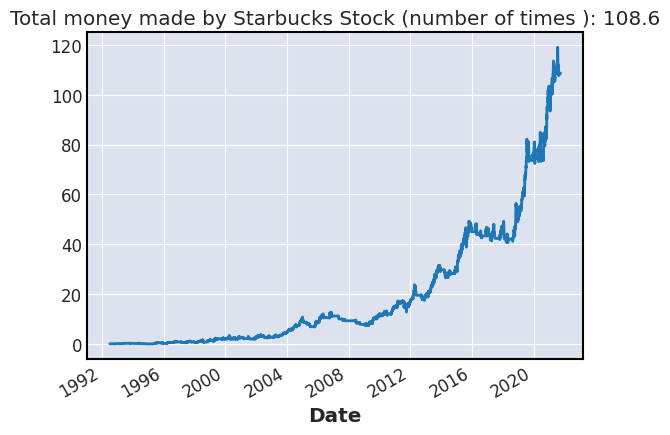

In [28]:
sbux['wealth'].plot()
plt.title('Total money made by Starbucks Stock (number of times ): {}'.format(round((sbux.loc[sbux.index[-2], 'wealth']),1)))

#### Calculate the probability of better investment

In [29]:
sbux['LogReturn'] = np.log(sbux['Close']).shift(-1) - np.log(sbux['Close'])
print(sbux['LogReturn'])

Date
1992-06-26    0.067440
1992-06-29   -0.033153
1992-06-30    0.022224
1992-07-01    0.000000
1992-07-02    0.000000
                ...   
2021-09-27   -0.017481
2021-09-28    0.004109
2021-09-29   -0.016721
2021-09-30    0.023385
2021-10-01         NaN
Name: LogReturn, Length: 7372, dtype: float64


#### Build a probability distribution function plot using scipy stats package

#### Plot a histogram on logarithm of returns

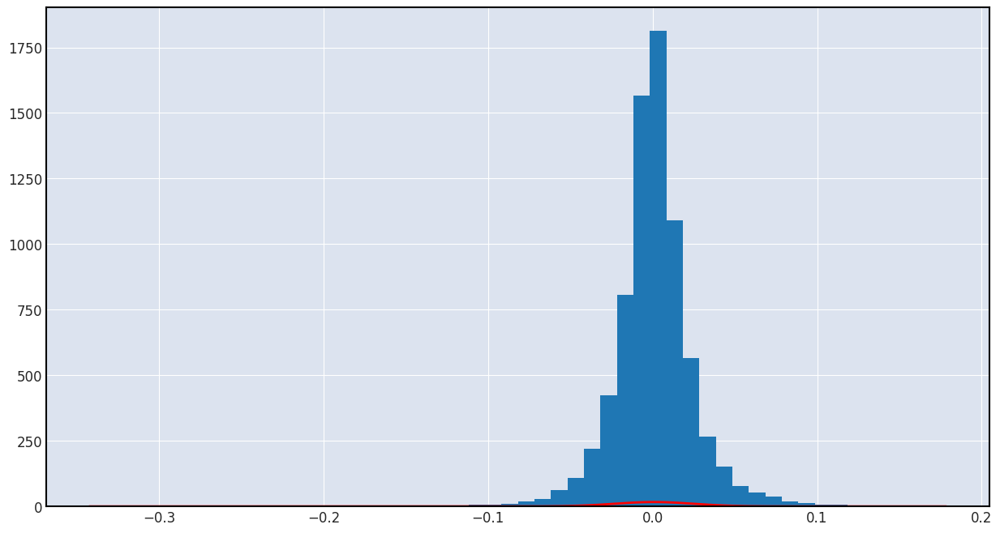

In [30]:
from scipy.stats import norm
mu = sbux['LogReturn'].mean()
sigma = sbux['LogReturn'].std(ddof=1)

density = pd.DataFrame()
density['x'] = np.arange(sbux['LogReturn'].min()-0.01, sbux['LogReturn'].max()+0.01, 0.001)
density['pdf'] = norm.pdf(density['x'], mu, sigma)

sbux['LogReturn'].hist(bins=50, figsize=(15, 8))
plt.plot(density['x'], density['pdf'], color='red')
plt.show()

#### Check for the probability od drops and jumps for a range

In [31]:
mu220 = 365*mu
sigma220 = (365**0.5) * sigma
for i in range(-5, 6, 1):
    drop = norm.cdf((-i)*0.05, mu220, sigma220)
    jump = norm.cdf(i*0.05, mu220, sigma220)
    print('The probability of %d percent drop is = %f & The probability of %d percent jump is = %f' % (i*5, round(drop,2), -i*5, round(jump,2)))

The probability of -25 percent drop is = 0.460000 & The probability of 25 percent jump is = 0.120000
The probability of -20 percent drop is = 0.420000 & The probability of 20 percent jump is = 0.140000
The probability of -15 percent drop is = 0.370000 & The probability of 15 percent jump is = 0.160000
The probability of -10 percent drop is = 0.330000 & The probability of 10 percent jump is = 0.190000
The probability of -5 percent drop is = 0.290000 & The probability of 5 percent jump is = 0.220000
The probability of 0 percent drop is = 0.260000 & The probability of 0 percent jump is = 0.260000
The probability of 5 percent drop is = 0.220000 & The probability of -5 percent jump is = 0.290000
The probability of 10 percent drop is = 0.190000 & The probability of -10 percent jump is = 0.330000
The probability of 15 percent drop is = 0.160000 & The probability of -15 percent jump is = 0.370000
The probability of 20 percent drop is = 0.140000 & The probability of -20 percent jump is = 0.4200

#### What is the Value At Risk for the Stock?

In [32]:
VaR = norm.ppf(0.05, mu, sigma)
print('Single day value at risk is: ', VaR)

Single day value at risk is:  -0.03868100011494516


#### What is the Mu and Sigma for the stock at 5 and 95 percentile?

In [33]:
# Quantile 
# 5% quantile
print('5% quantile ', norm.ppf(0.05, mu, sigma))
# 95% quantile
print('95% quantile ', norm.ppf(0.95, mu, sigma))

5% quantile  -0.03868100011494516
95% quantile  0.040311427705829336


#### What is the confidence level at various levels?

In [34]:
sbux['logReturn'] = np.log(sbux['Close'].shift(-1)) - np.log(sbux['Close'])
sample_size = sbux['logReturn'].shape[0]
sample_mean = sbux['logReturn'].mean()
sample_std = sbux['logReturn'].std(ddof=1) / sample_size**0.5
# left and right quantile
for i in range(1,10):
    z_left = norm.ppf(0.05*i)
    z_right = norm.ppf((1-0.05*i))
    interval_left = sample_mean+z_left*sample_std
    interval_right = sample_mean+z_right*sample_std
    print('%d percent confidence interval is ' % (100-i*2*5), ( round(interval_left,6), round(interval_right,6)))

90 percent confidence interval is  (0.000355, 0.001275)
80 percent confidence interval is  (0.000457, 0.001174)
70 percent confidence interval is  (0.000525, 0.001105)
60 percent confidence interval is  (0.00058, 0.001051)
50 percent confidence interval is  (0.000627, 0.001004)
40 percent confidence interval is  (0.000669, 0.000962)
30 percent confidence interval is  (0.000707, 0.000923)
20 percent confidence interval is  (0.000744, 0.000886)
10 percent confidence interval is  (0.00078, 0.00085)


# [4️⃣.1️⃣ MACD Forecasting of data using Pandas TA](#4.1)

### Let us do a bit of MACD based Trading indicators


##### Inspiration from Alpharithms -  https://www.alpharithms.com/calculate-macd-python-272222/

#### Created MACD Values

In [35]:

# Get the 26-day EMA of the closing price
k = sbux['Close'].ewm(span=12, adjust=False, min_periods=12).mean()
# Get the 12-day EMA of the closing price
d = sbux['Close'].ewm(span=26, adjust=False, min_periods=26).mean()
# Subtract the 26-day EMA from the 12-Day EMA to get the MACD
macd = k - d
# Get the 9-Day EMA of the MACD for the Trigger line
macd_s = macd.ewm(span=9, adjust=False, min_periods=9).mean()
# Calculate the difference between the MACD - Trigger for the Convergence/Divergence value
macd_h = macd - macd_s
# Add all of our new values for the MACD to the dataframe
sbux['macd'] = sbux.index.map(macd)
sbux['macd_h'] = sbux.index.map(macd_h)
sbux['macd_s'] = sbux.index.map(macd_s)
# View our data
pd.set_option("display.max_columns", None)
print(sbux)

                  Date        Open        High         Low       Close  \
Date                                                                     
1992-06-26  1992-06-26    0.270957    0.287086    0.264507    0.277409   
1992-06-29  1992-06-29    0.280635    0.303215    0.274183    0.296763   
1992-06-30  1992-06-30    0.303215    0.306440    0.283860    0.287086   
1992-07-01  1992-07-01    0.290312    0.296763    0.280635    0.293538   
1992-07-02  1992-07-02    0.296763    0.296763    0.287086    0.293538   
...                ...         ...         ...         ...         ...   
2021-09-27  2021-09-27  113.610001  114.669998  112.910004  113.680000   
2021-09-28  2021-09-28  112.680000  113.000000  111.080002  111.709999   
2021-09-29  2021-09-29  111.900002  112.519997  111.570000  112.169998   
2021-09-30  2021-09-30  111.519997  112.160004  110.309998  110.309998   
2021-10-01  2021-10-01  110.889999  113.459999  110.540001  112.919998   

               Volume  Dividends  Sto

#### Calculate MACD through Pandas Technical Analysis Library

In [36]:
try: 
    import pandas_ta as ta
except:
    !pip install pandas_ta
    import pandas_ta as ta



     |████████████████████████████████| 115 kB 567 kB/s 
  Created wheel for pandas-ta: filename=pandas_ta-0.3.14b0-py3-none-any.whl size=218923 sha256=cc64f25b4911010fd4cb4c223d35db62907095f3823cdda4eaf763b7068d0586
  Stored in directory: /root/.cache/pip/wheels/0b/81/f0/cca85757840e4616a2c6b9fe12569d97d324c27cac60724c58
Successfully built pandas-ta


In [37]:

# Calculate MACD values using the pandas_ta library
sbux2.ta.macd(close='close', fast=12, slow=26, signal=9, append=True)
# View result
pd.set_option("display.max_columns", None)  # show all columns
print(sbux2)


                  Open        High         Low       Close     Volume  \
Date                                                                    
1992-06-26    0.270957    0.287086    0.264507    0.277409  224358400   
1992-06-29    0.280635    0.303215    0.274183    0.296763   58732800   
1992-06-30    0.303215    0.306440    0.283860    0.287086   34777600   
1992-07-01    0.290312    0.296763    0.280635    0.293538   18316800   
1992-07-02    0.296763    0.296763    0.287086    0.293538   13996800   
...                ...         ...         ...         ...        ...   
2021-09-27  113.610001  114.669998  112.910004  113.680000    3988800   
2021-09-28  112.680000  113.000000  111.080002  111.709999    5917700   
2021-09-29  111.900002  112.519997  111.570000  112.169998    4389100   
2021-09-30  111.519997  112.160004  110.309998  110.309998    5974500   
2021-10-01  110.889999  113.459999  110.540001  112.919998    5244849   

            Dividends  Splits          42         

### Let us do some plotting

In [38]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# calculate MACD values
sbux2.ta.macd(close='close', fast=12, slow=26, append=True)
# Force lowercase (optional)
sbux2.columns = [x.lower() for x in sbux2.columns]
# Construct a 2 x 1 Plotly figure
fig = make_subplots(rows=2, cols=1)
# price Line
fig.append_trace(
    go.Scatter(
        x=sbux2.index,
        y=sbux2['open'],
        line=dict(color='lawngreen', width=1),
        name='open',
        # showlegend=False,
        legendgroup='1',
    ), row=1, col=1
)
# Candlestick chart for pricing
fig.append_trace(
    go.Candlestick(
        x=sbux2.index,
        open=sbux2['open'],
        high=sbux2['high'],
        low=sbux2['low'],
        close=sbux2['close'],
        increasing_line_color='lawngreen',
        decreasing_line_color='black',
        showlegend=False
    ), row=1, col=1
)
# Fast Signal (%k)
fig.append_trace(
    go.Scatter(
        x=sbux2.index,
        y=sbux2['macd_12_26_9'],
        line=dict(color='lawngreen', width=2),
        name='macd',
        # showlegend=False,
        legendgroup='2',
    ), row=2, col=1
)
# Slow signal (%d)
fig.append_trace(
    go.Scatter(
        x=sbux2.index,
        y=sbux2['macds_12_26_9'],
        line=dict(color='mediumblue', width=2),
        # showlegend=False,
        legendgroup='2',
        name='signal'
    ), row=2, col=1
)
# Colorize the histogram values
colors = np.where(sbux2['macdh_12_26_9'] < 0, '#000', 'lawngreen')
# Plot the histogram
fig.append_trace(
    go.Bar(
        x=sbux2.index,
        y=sbux2['macdh_12_26_9'],
        name='histogram',
        marker_color=colors,
    ), row=2, col=1
)
# Make it pretty
layout = go.Layout(
    plot_bgcolor='linen',
    # Font Families
    font_family='Monospace',
    font_color='mediumblue',
    font_size=20,
    xaxis=dict(
        rangeslider=dict(
            visible=False
        )
    )
)
# Update options and show plot
fig.update_layout(layout)
fig.update_layout(height=800,width=1200,dragmode='lasso')
fig.show()
del sbux2

# [5️⃣ Let us do a financial ratios calculation using FINTA library](#5)

* Simple Moving Average 'SMA'
* Simple Moving Median 'SMM'
* Smoothed Simple Moving Average 'SSMA'
* Exponential Moving Average 'EMA'
* Double Exponential Moving Average 'DEMA'
* Triple Exponential Moving Average 'TEMA'
* Triangular Moving Average 'TRIMA'
* Triple Exponential Moving Average Oscillator 'TRIX'
* Volume Adjusted Moving Average 'VAMA'
* Kaufman Efficiency Indicator 'ER'
* Kaufman's Adaptive Moving Average 'KAMA'
* Zero Lag Exponential Moving Average 'ZLEMA'
* Weighted Moving Average 'WMA'
* Hull Moving Average 'HMA'
* Elastic Volume Moving Average 'EVWMA'
* Volume Weighted Average Price 'VWAP'
* Smoothed Moving Average 'SMMA'
* Fractal Adaptive Moving Average 'FRAMA'
* Moving Average Convergence Divergence 'MACD'
* Percentage Price Oscillator 'PPO'
* Volume-Weighted MACD 'VW_MACD'
* Elastic-Volume weighted MACD 'EV_MACD'
* Market Momentum 'MOM'
* Rate-of-Change 'ROC'
* Relative Strenght Index 'RSI'
* Inverse Fisher Transform RSI 'IFT_RSI'
* True Range 'TR'
* Average True Range 'ATR'
* Stop-and-Reverse 'SAR'
* Bollinger Bands 'BBANDS'
* Bollinger Bands Width 'BBWIDTH'
* Momentum Breakout Bands 'MOBO'
* Percent B 'PERCENT_B'
* Keltner Channels 'KC'
* Donchian Channel 'DO'
* Directional Movement Indicator 'DMI'
* Average Directional Index 'ADX'
* Pivot Points 'PIVOT'
* Fibonacci Pivot Points 'PIVOT_FIB'
* Stochastic Oscillator %K 'STOCH'
* Stochastic oscillator %D 'STOCHD'
* Stochastic RSI 'STOCHRSI'
* Williams %R 'WILLIAMS'
* Ultimate Oscillator 'UO'
* Awesome Oscillator 'AO'
* Mass Index 'MI'
* Vortex Indicator 'VORTEX'
* Know Sure Thing 'KST'
* True Strength Index 'TSI'
* Typical Price 'TP'
* Accumulation-Distribution Line 'ADL'
* Chaikin Oscillator 'CHAIKIN'
* Money Flow Index 'MFI'
* On Balance Volume 'OBV'
* Weighter OBV 'WOBV'
* Volume Zone Oscillator 'VZO'
* Price Zone Oscillator 'PZO'
* Elder's Force Index 'EFI'
* Cummulative Force Index 'CFI'
* Bull power and Bear Power 'EBBP'
* Ease of Movement 'EMV'
* Commodity Channel Index 'CCI'
* Coppock Curve 'COPP'
* Buy and Sell Pressure 'BASP'
* Normalized BASP 'BASPN'
* Chande Momentum Oscillator 'CMO'
* Chandelier Exit 'CHANDELIER'
* Qstick 'QSTICK'
* Twiggs Money Index 'TMF'
* Wave Trend Oscillator 'WTO'
* Fisher Transform 'FISH'
* Ichimoku Cloud 'ICHIMOKU'
* Adaptive Price Zone 'APZ'
* Squeeze Momentum Indicator 'SQZMI'
* Volume Price Trend 'VPT'
* Finite Volume Element 'FVE'
* Volume Flow Indicator 'VFI'
* Moving Standard deviation 'MSD'
* Schaff Trend Cycle 'STC'


In [39]:
try:
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover
except:
    !pip install finta backtesting
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover


     |████████████████████████████████| 175 kB 863 kB/s 
  Created wheel for backtesting: filename=Backtesting-0.3.3-py3-none-any.whl size=173823 sha256=5ed49fded4329d1182302db731442b430f559ed8d7c7367cc88624e9589928cc
  Stored in directory: /root/.cache/pip/wheels/48/1d/ea/65dacebc37da7655d8a1fd0f315ac39d102e31d6545237a1c6
Successfully built backtesting


Loading BokehJS ...

In [40]:
fin_sbux = pd.read_csv('../input/starbucks-stock-data-live-and-latest/Starbucks_stock_history.csv', index_col="Date", parse_dates=True)
print(fin_sbux.head())
ohlc=fin_sbux
print(TA.SMA(ohlc, 42))
#will return Pandas Series object with "Awesome oscillator" values
TA.AO(ohlc)
#expects ["volume"] column as input
print(TA.OBV(ohlc))
#will return Series with Bollinger Bands columns [BB_UPPER, BB_LOWER]
print(TA.BBANDS(ohlc))
#will return Series with calculated BBANDS values but will use KAMA instead of MA for calculation, other types of Moving Averages are allowed as well.
print(TA.BBANDS(ohlc, MA=TA.KAMA(ohlc, 20)))

                Open      High       Low     Close     Volume  Dividends  \
Date                                                                       
1992-06-26  0.270957  0.287086  0.264507  0.277409  224358400        0.0   
1992-06-29  0.280635  0.303215  0.274183  0.296763   58732800        0.0   
1992-06-30  0.303215  0.306440  0.283860  0.287086   34777600        0.0   
1992-07-01  0.290312  0.296763  0.280635  0.293538   18316800        0.0   
1992-07-02  0.296763  0.296763  0.287086  0.293538   13996800        0.0   

            Stock Splits  
Date                      
1992-06-26           0.0  
1992-06-29           0.0  
1992-06-30           0.0  
1992-07-01           0.0  
1992-07-02           0.0  
Date
1992-06-26           NaN
1992-06-29           NaN
1992-06-30           NaN
1992-07-01           NaN
1992-07-02           NaN
                 ...    
2021-09-27    116.420898
2021-09-28    116.178116
2021-09-29    115.968818
2021-09-30    115.740375
2021-10-01    115.60348

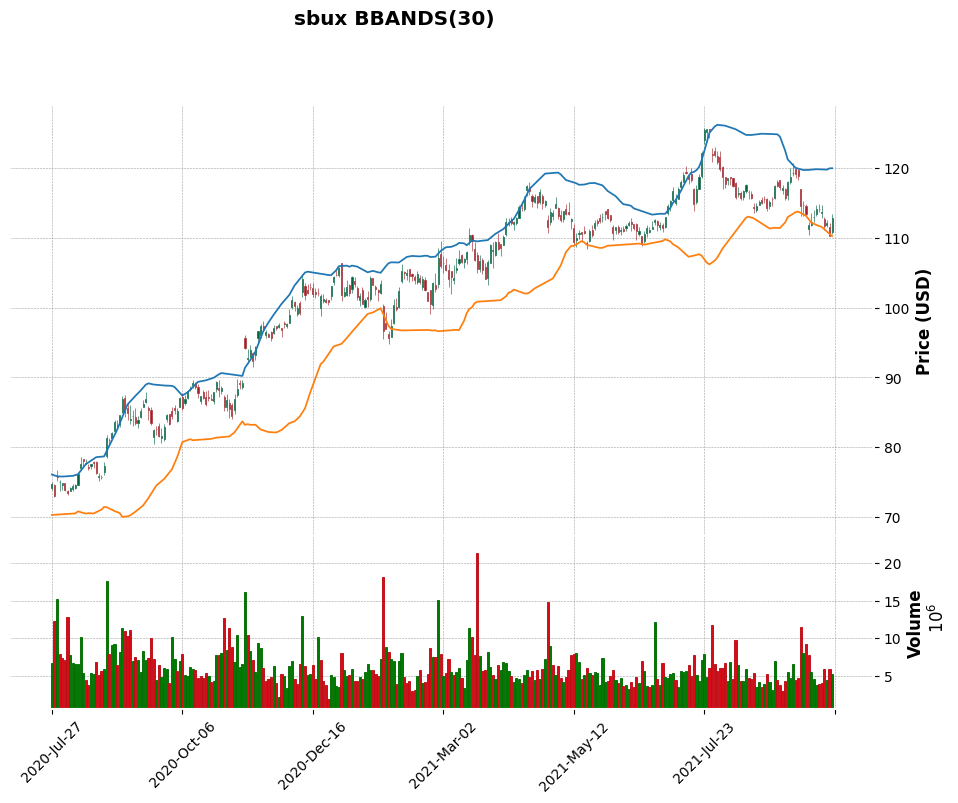

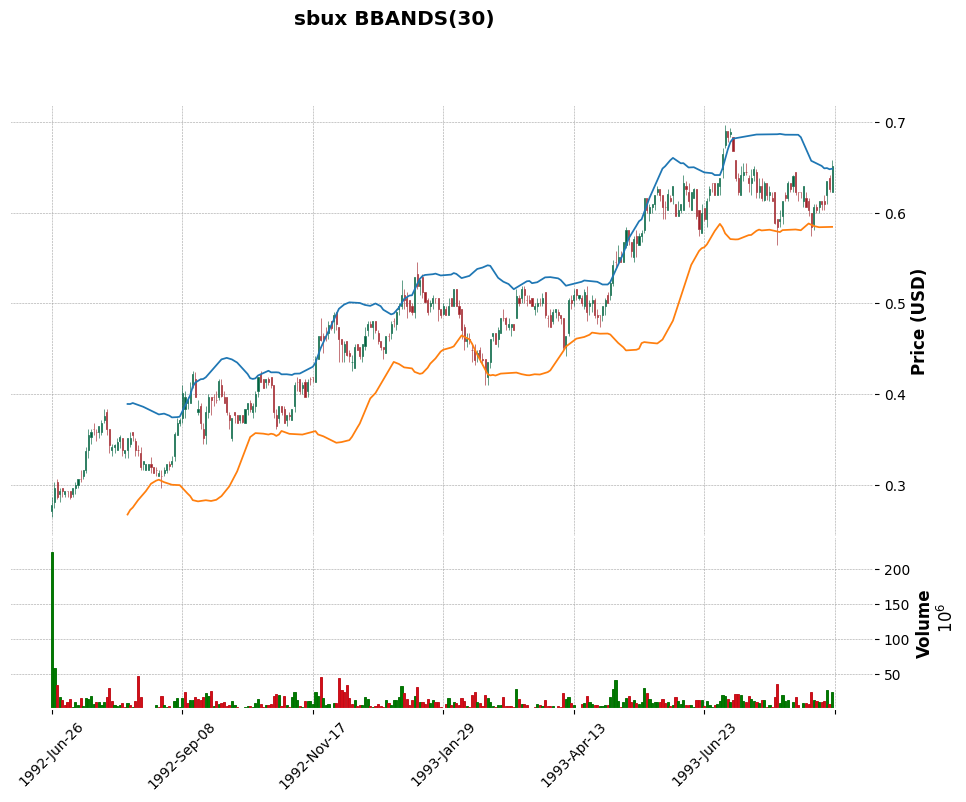

In [41]:

# calc bol band
bbands = TA.BBANDS(fin_sbux, 30)

# cherry pick what to show on the chart
bands_plot = pd.concat([bbands.BB_UPPER, bbands.BB_LOWER], axis=1)

apd = mpf.make_addplot(bands_plot.tail(300))

mpf.plot(fin_sbux.tail(300), type='candle', style='charles',
        title='sbux BBANDS(30)',
        ylabel='Price (USD)',
        ylabel_lower='Volume',
        volume=True,
        figscale=1.5,
        addplot=apd
        )

apd = mpf.make_addplot(bands_plot.head(300))

mpf.plot(fin_sbux.head(300), type='candle', style='charles',
        title='sbux BBANDS(30)',
        ylabel='Price (USD)',
        ylabel_lower='Volume',
        volume=True,
        figscale=1.5,
        addplot=apd
        )

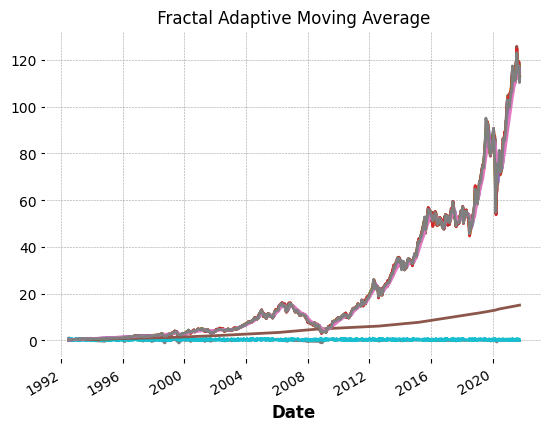

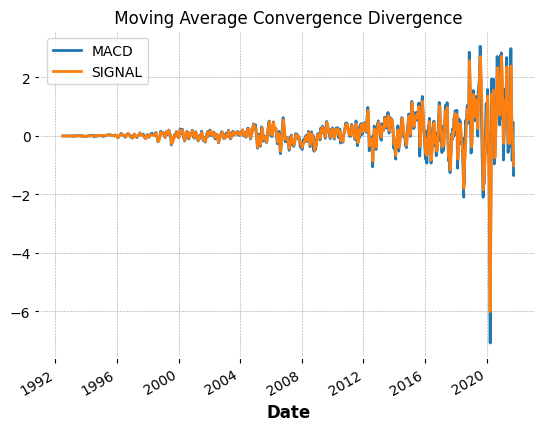

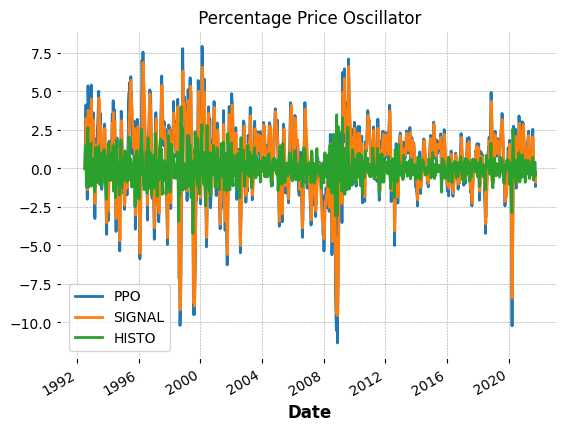

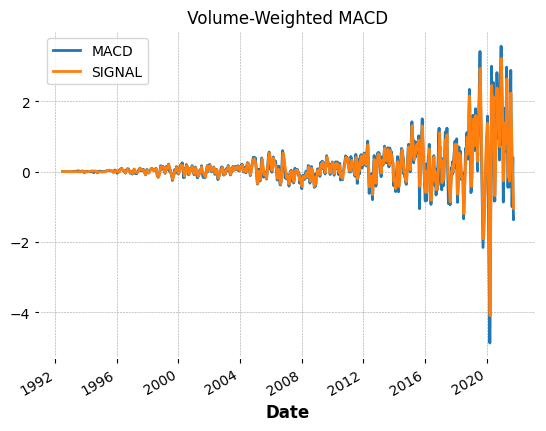

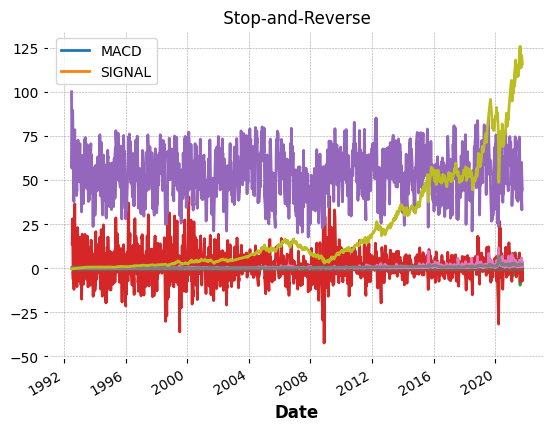

...

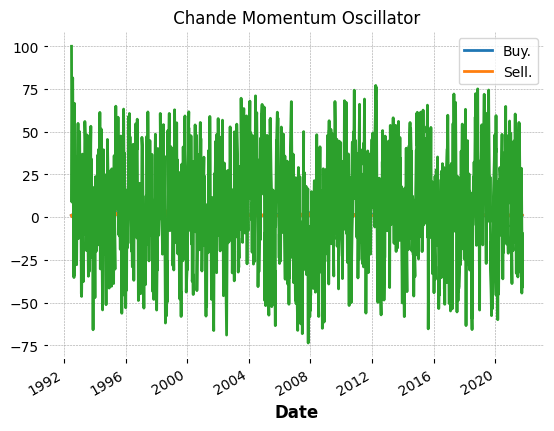

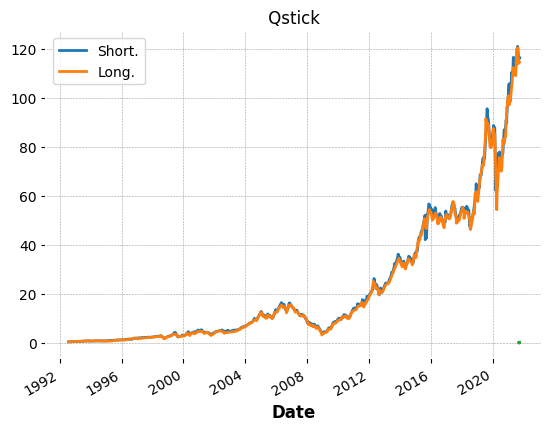

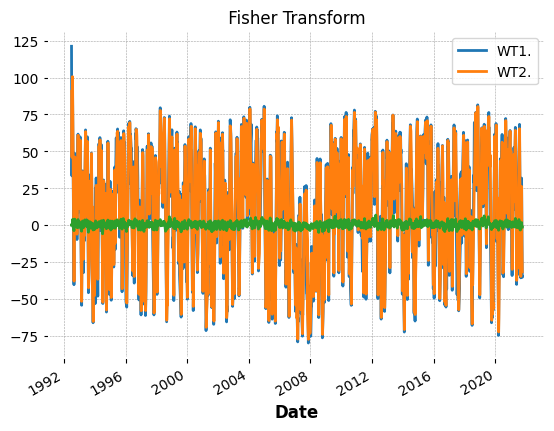

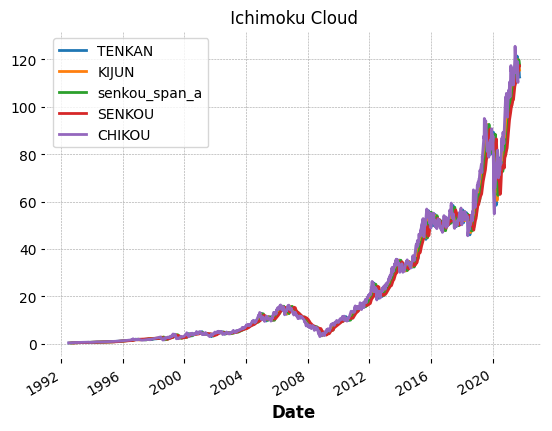

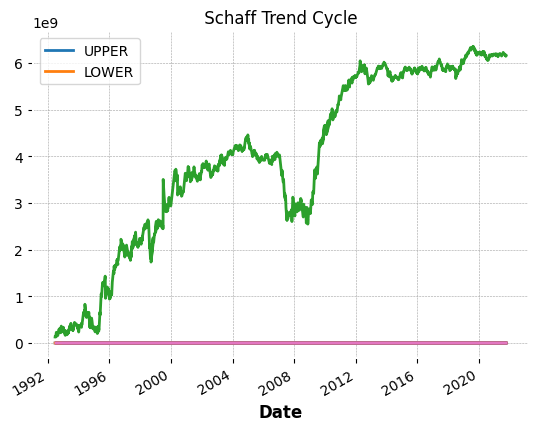

In [42]:

function_dict = {' Simple Moving Average ' : 'SMA',
                 ' Simple Moving Median ' : 'SMM',
                 ' Smoothed Simple Moving Average ' : 'SSMA',
                 ' Exponential Moving Average ' : 'EMA',
                 ' Double Exponential Moving Average ' : 'DEMA',
                 ' Triple Exponential Moving Average ' : 'TEMA',
                 ' Triangular Moving Average ' : 'TRIMA',
                 ' Triple Exponential Moving Average Oscillator ' : 'TRIX',
                 ' Volume Adjusted Moving Average ' : 'VAMA',
                 ' Kaufman Efficiency Indicator ' : 'ER',
                 ' Kaufmans Adaptive Moving Average ' : 'KAMA',
                 ' Zero Lag Exponential Moving Average ' : 'ZLEMA',
                 ' Weighted Moving Average ' : 'WMA',
                 ' Hull Moving Average ' : 'HMA',
                 ' Elastic Volume Moving Average ' : 'EVWMA',
                 ' Volume Weighted Average Price ' : 'VWAP',
                 ' Smoothed Moving Average ' : 'SMMA',
                 ' Fractal Adaptive Moving Average ' : 'FRAMA',
                 ' Moving Average Convergence Divergence ' : 'MACD',
                 ' Percentage Price Oscillator ' : 'PPO',
                 ' Volume-Weighted MACD ' : 'VW_MACD',
                 ' Elastic-Volume weighted MACD ' : 'EV_MACD',
                 ' Market Momentum ' : 'MOM',
                 ' Rate-of-Change ' : 'ROC',
                 ' Relative Strength Index ' : 'RSI',
                 ' Inverse Fisher Transform RSI ' : 'IFT_RSI',
                 ' True Range ' : 'TR',
                 ' Average True Range ' : 'ATR',
                 ' Stop-and-Reverse ' : 'SAR',
                 ' Bollinger Bands ' : 'BBANDS',
                 ' Bollinger Bands Width ' : 'BBWIDTH',
                 ' Momentum Breakout Bands ' : 'MOBO',
                 ' Percent B ' : 'PERCENT_B',
                 ' Keltner Channels ' : 'KC',
                 ' Donchian Channel ' : 'DO',
                 ' Directional Movement Indicator ' : 'DMI',
                 ' Average Directional Index ' : 'ADX',
                 ' Pivot Points ' : 'PIVOT',
                 ' Fibonacci Pivot Points ' : 'PIVOT_FIB',
                 ' Stochastic Oscillator Percent K ' : 'STOCH',
                 ' Stochastic oscillator Percent D ' : 'STOCHD',
                 ' Stochastic RSI ' : 'STOCHRSI',
                 ' Williams Percent R ' : 'WILLIAMS',
                 ' Ultimate Oscillator ' : 'UO',
                 ' Awesome Oscillator ' : 'AO',
                 ' Mass Index ' : 'MI',
                 ' Vortex Indicator ' : 'VORTEX',
                 ' Know Sure Thing ' : 'KST',
                 ' True Strength Index ' : 'TSI',
                 ' Typical Price ' : 'TP',
                 ' Accumulation-Distribution Line ' : 'ADL',
                 ' Chaikin Oscillator ' : 'CHAIKIN',
                 ' Money Flow Index ' : 'MFI',
                 ' On Balance Volume ' : 'OBV',
                 ' Weighter OBV ' : 'WOBV',
                 ' Volume Zone Oscillator ' : 'VZO',
                 ' Price Zone Oscillator ' : 'PZO',
                 ' Elders Force Index ' : 'EFI',
                 ' Cummulative Force Index ' : 'CFI',
                 ' Bull power and Bear Power ' : 'EBBP',
                 ' Ease of Movement ' : 'EMV',
                 ' Commodity Channel Index ' : 'CCI',
                 ' Coppock Curve ' : 'COPP',
                 ' Buy and Sell Pressure ' : 'BASP',
                 ' Normalized BASP ' : 'BASPN',
                 ' Chande Momentum Oscillator ' : 'CMO',
                 ' Chandelier Exit ' : 'CHANDELIER',
                 ' Qstick ' : 'QSTICK',
                 #' Twiggs Money Index ' : 'TMF',
                 ' Wave Trend Oscillator ' : 'WTO',
                 ' Fisher Transform ' : 'FISH',
                 ' Ichimoku Cloud ' : 'ICHIMOKU',
                 ' Adaptive Price Zone ' : 'APZ',
                 #' Squeeze Momentum Indicator ' : 'SQZMI',
                 ' Volume Price Trend ' : 'VPT',
                 ' Finite Volume Element ' : 'FVE',
                 ' Volume Flow Indicator ' : 'VFI',
                 ' Moving Standard deviation ' : 'MSD',
                 ' Schaff Trend Cycle ' : 'STC'}

for key, value in function_dict .items():
    function_name = "TA." + value + "(ohlc).plot(title='" + key + "')"
    result = eval(function_name)


## Use backtesting library to do a simple data backtesting

In [43]:
# Defining DEMA cross strategy
class DemaCross(Strategy):

    def init(self):

        self.ma1 = self.I(TA.DEMA, ohlc, 10)
        self.ma2 = self.I(TA.DEMA, ohlc, 20)

    def next(self):
        if crossover(self.ma1, self.ma2):
            self.buy()
        elif crossover(self.ma2, self.ma1):
            self.sell()

In [44]:
bt = Backtest(ohlc, DemaCross,
              cash=10000, commission=0.025)

### Let us check the Backtesting summary

In [45]:
bt.run()

Start                     1992-06-26 00:00:00
End                       2021-10-01 00:00:00
Duration                  10689 days 00:00:00
Exposure Time [%]                     2.94357
Equity Final [$]                          0.0
Equity Peak [$]                       10000.0
Return [%]                             -100.0
Buy & Hold Return [%]            40605.197753
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]             1408.317779
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                      -100.0
Avg. Drawdown [%]                      -100.0
Max. Drawdown Duration    10685 days 00:00:00
Avg. Drawdown Duration    10685 days 00:00:00
# Trades                                    1
Win Rate [%]                              0.0
Best Trade [%]                    -100.569526
Worst Trade [%]                   -100.569526
Avg. Trade [%]                    

## It is very evidend that albeit some volatility, it is a pretty solid long term stock with outstanding run over last 5 years.

> 

# [6️⃣ Let us do a financial ratios calculation](#6)


### Let us try Sharpe Ratio

In [46]:
def sharpe_ratio(return_series, N, rf):
    mean = return_series.mean() * N -rf
    sigma = return_series.std() * np.sqrt(N)
    return mean / sigma

N = 255 #255 trading days in a year
rf =0.018 #1.8% risk free rate
sbux.columns
temp_df=sbux[['Close']]
sharpes = temp_df.apply(sharpe_ratio, args=(N,rf,))#,axis=0)
print("The Sharpe Ratio for the stock i =" , round(sharpes[0],2))
del sharpes


The Sharpe Ratio for the stock i = 12.84


In [47]:
def calculate_sortino(series,N, rf):
    expected_return = np.mean(series)
    below_avg = [i for i in series if i < expected_return]
    risk_free = rf
    sortino = (expected_return - risk_free) / np.std(below_avg)
    return round(sortino, 2)

sortinos = temp_df.apply(calculate_sortino, args=(N,rf,))
print("The Sortino Ratio for the stock is =" , round(sortinos[0],2))
del sortinos

The Sortino Ratio for the stock is = 4.13


In [48]:
def max_drawdown(return_series):
    comp_ret = (return_series+1).cumprod()
    peak = comp_ret.expanding(min_periods=1).max()
    dd = (comp_ret/peak)-1
    return dd.min()


max_drawdowns = temp_df.apply(max_drawdown,axis=0)
print("The max_drawdowns Ratio for the stock is =" , round(max_drawdowns[0],2))

del max_drawdowns
del temp_df

The max_drawdowns Ratio for the stock is = 0.0


## Try Bollinger Bands Price

In [49]:
def bollinger_bands_price(price):
    up, mid, low = BBANDS(close, timeperiod=20, nbdevup=2, nbdevdn=2, matype=0)
    bollinger_bands_price = (price['Close'] - low) / (up - low)
    return bollinger_bands_price

# [7️⃣ Let us do a bit of forecasting using Regression ](#7)

 Some inspiration from the following post as well
*  [MLQ.AI](https://www.mlq.ai/price-prediction-with-linear-regression/)


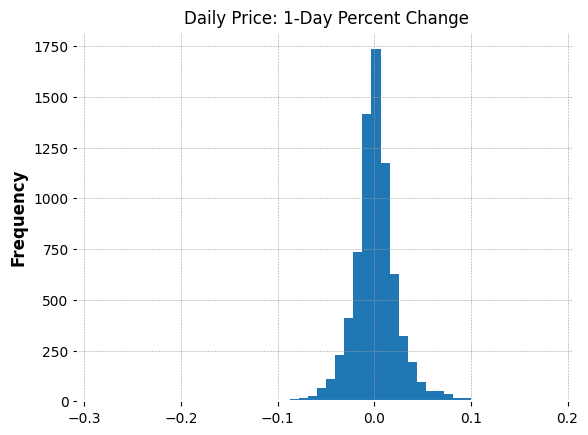

In [50]:
# Histogram of the daily price change percent of 'Close' price
sbux['Close'].pct_change().plot.hist(bins=50)
plt.title('Daily Price: 1-Day Percent Change')
plt.show() 

In [51]:
# Create 5-day % changes of Last for the current day, and 5 days in the future
sbux['5d_future_close'] = sbux['Close'].shift(-5)
sbux['5d_close_future_pct'] = sbux['5d_future_close'].pct_change(5)
sbux['5d_close_pct'] = sbux['Close'].pct_change(5)

In [52]:
# Calculate the correlation matrix between the 5d close pecentage changes (current and future)
corr = sbux[['5d_close_pct', '5d_close_future_pct']].corr()

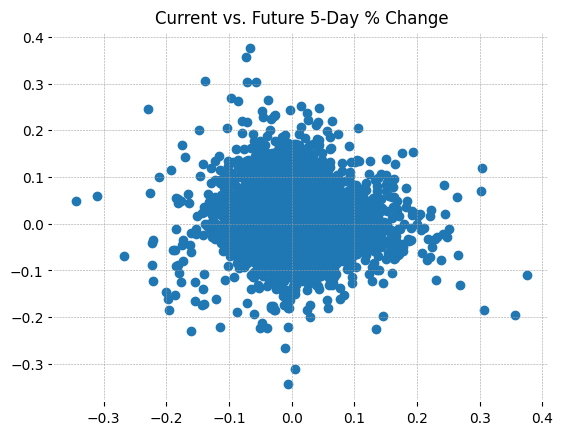

In [53]:
# Scatter the current 5-day percent change vs the future 5-day percent change
plt.scatter(sbux['5d_close_pct'], sbux['5d_close_future_pct'])
plt.title('Current vs. Future 5-Day % Change')
plt.show()

In [54]:
# a list of the feature names for later
feature_names = ['5d_close_pct']  

In [55]:
# Drop all na values
sbux = sbux.dropna()

# Create features and targets
# use feature_names for features; 5d_close_future_pct for targets
features = sbux[feature_names]
targets = sbux['5d_close_future_pct']

# Create DataFrame from target column and feature columns
feat_targ_df = sbux[['5d_close_future_pct'] + feature_names]

# Calculate correlation matrix
corr = feat_targ_df.corr()
print(corr)

                     5d_close_future_pct  5d_close_pct
5d_close_future_pct             1.000000     -0.065341
5d_close_pct                   -0.065341      1.000000


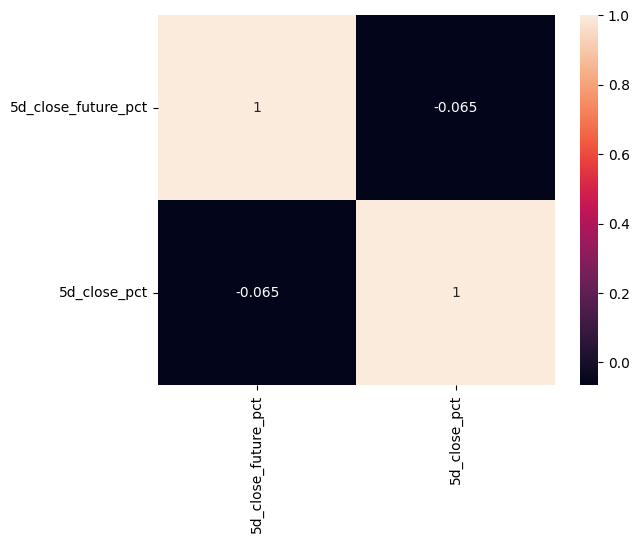

In [56]:
import seaborn as sns
# Plot heatmap of correlation matrix
sns.heatmap(corr, annot=True)
plt.yticks(rotation=0); plt.xticks(rotation=90) # fix ticklabel directions
plt.show() # show the plot

In [57]:
import statsmodels.api as sm

# Add a constant to the features
linear_features = sm.add_constant(features)

# Create a size for the training set that is 80% of the total number of rows
#.shape gives us the number of rows in our data, and convert to an int
train_size = int(0.8 * features.shape[0])

# split features and targets using python indexing
train_features = linear_features[:train_size]
train_targets = targets[:train_size]
test_features = linear_features[train_size:]
test_targets = targets[train_size:]
print(linear_features.shape, train_features.shape, test_features.shape)

(6868, 2) (5494, 2) (1374, 2)


In [58]:
# Create the linear model and complete the least squares fit
model = sm.OLS(train_targets, train_features)
results = model.fit()  # fit the model
print(results.summary())

# examine pvalues
# Features with p <= 0.05 are typically considered significantly different from 0
print(results.pvalues)

# Make predictions from our model for train and test sets
train_predictions = results.predict(train_features)
test_predictions = results.predict(test_features)

                             OLS Regression Results                            
Dep. Variable:     5d_close_future_pct   R-squared:                       0.004
Model:                             OLS   Adj. R-squared:                  0.004
Method:                  Least Squares   F-statistic:                     24.67
Date:                 Wed, 09 Mar 2022   Prob (F-statistic):           7.02e-07
Time:                         16:11:27   Log-Likelihood:                 8347.0
No. Observations:                 5494   AIC:                        -1.669e+04
Df Residuals:                     5492   BIC:                        -1.668e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0057      0.001    

# [8️⃣ Let us do a Forecasting using FB Prophet ](#8)


# Use of Facebook Prophet for Stock Forecasting
## Starbucks Stock forecast 
* This kernel uses Facebook Prophet (which uses SKLEARN) and Neural Prophet (which uses PyTorch) libaries to predict stocks. This kernel splits the NASDAQ stocks into ten folds and creates 10 output files each for the stocks in a PDF Format

###  Yahoo! DataReader Download
<div class="alert alert-block alert-info">
<b>Step-1:</b> Download data using Yahoo! Finance Data Reader</div>

###  Facebook Prophet Models
<div class="alert alert-block alert-info">
<b>Step-2:</b> Build Facebook Prophet Input dataset</div>
<div class="alert alert-block alert-info">
<b>Step-3:</b> Run Prophet Model</div>
<div class="alert alert-block alert-info">
<b>Step-4:</b> Generate Model Visualization </div>
<div class="alert alert-block alert-info">
<b>Step-5:</b> Generate the Image Files </div>
<div class="alert alert-block alert-info">
<b>Step-6:</b> Consolidate Image Files for Facebook Prophet Model </div>

###  Neural Prophet Models
<div class="alert alert-block alert-warning">
<b>Step-7-11:</b> Repeat Steps 2-6 for Neural Prophet Model </div>



In [59]:
try:
    from fbprophet.plot import plot_plotly
    from fbprophet import Prophet
except:
    !pip install fbprophet    # install Facebook Prophet
    from fbprophet.plot import plot_plotly
    from fbprophet import Prophet
    

In [60]:
from fbprophet.plot import plot_plotly
from fbprophet import Prophet

In [61]:
def plot_close_val(data_frame, column, stock):
    plt.figure(figsize=(16,6))
    plt.title(column + ' Price History for ' + stock )
    plt.plot(data_frame[column])
    plt.xlabel('Date', fontsize=18)
    plt.ylabel(column + ' Price USD ($) for ' + stock, fontsize=18)
    plt.show()

In [62]:
def fb_prophet_plot(df, param, stock):
    # Check the dataset
    #df.head()
    # Create Dataset based on the FB Prophet standard ds/y
    df2 = pd.DataFrame([], columns = ['ds', 'y'])
    df2.columns=['ds','y']
    df2['ds']=pd.to_datetime(df.index,format='%Y-%m')
    #Assign the Parameter
    df2['y']=df[param].values
    #check the new DS
    #df2.head()
    
    #create a new Prophet Model
    model=Prophet(interval_width=0.95,yearly_seasonality=True)
    
    #Fit the Model
    model.fit(df2)
    #Predict the future
    future=model.make_future_dataframe(periods=50, freq='MS')
    forecast=model.predict(future)
    #Save the predicted model
    preds= forecast['yhat'][:-50]
    #plot the graph
    title = 'FB Prophet predictions for ==> ' + stock
    plt.figure(figsize=(16,8))
    plt.plot(df2.ds,preds,color='#555555',label=' Predictions')
    plt.plot(df2.ds,df2.y,color='#1155FF',label='Actual')
    plt.title(title)
    plt.legend()
    plt.show()
    figure=model.plot(forecast,xlabel='Date',ylabel='Price')
    figure.set_size_inches(16,8)
    plt.title(title)
    model.plot_components(forecast)
    plt.show()

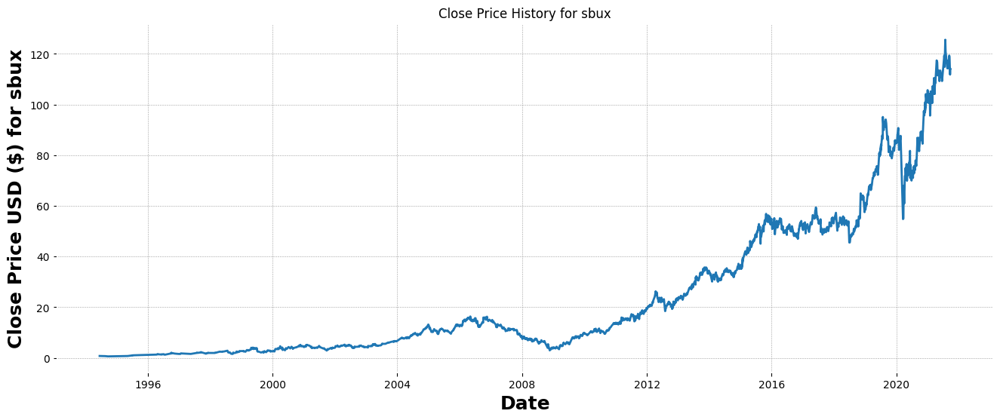

Initial log joint probability = -313.775
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18168.7     0.0187718        991.99           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18446.7      0.118238       3774.15           1           1      240   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       18522.8     0.0537005       2948.14           1           1      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       18589.3    0.00153242       533.403           1           1      467   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       18620.9    0.00143608       914.979      0.6462      0.6462      576   
    Iter      log prob        ||dx||      ||grad||       alpha  

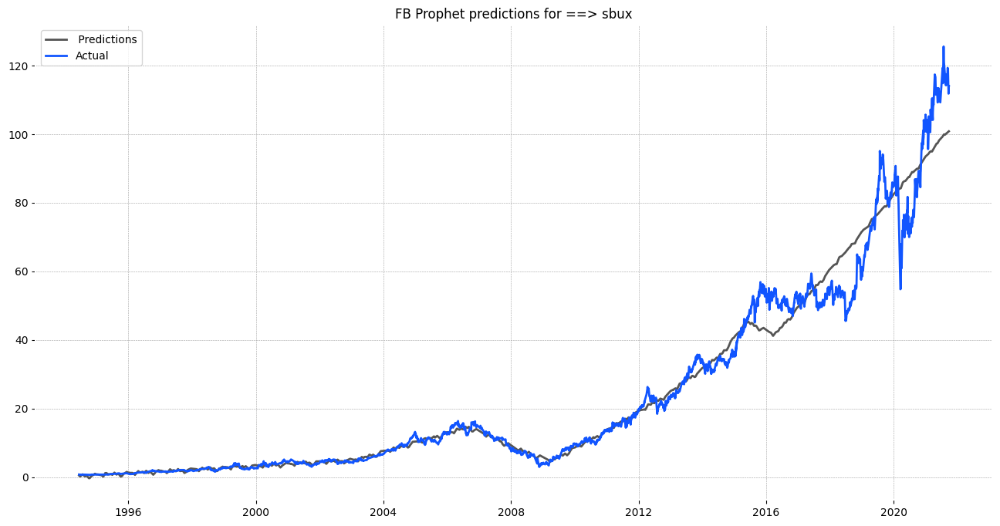

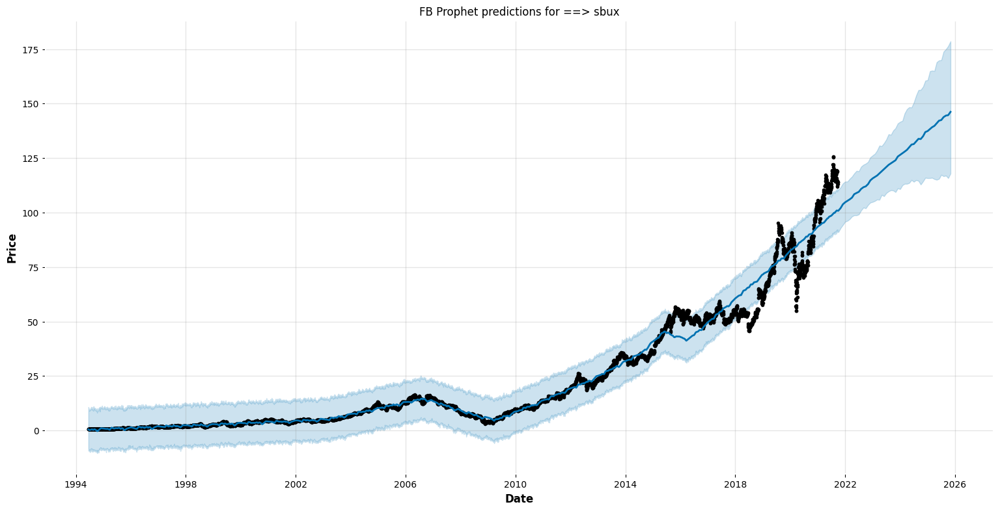

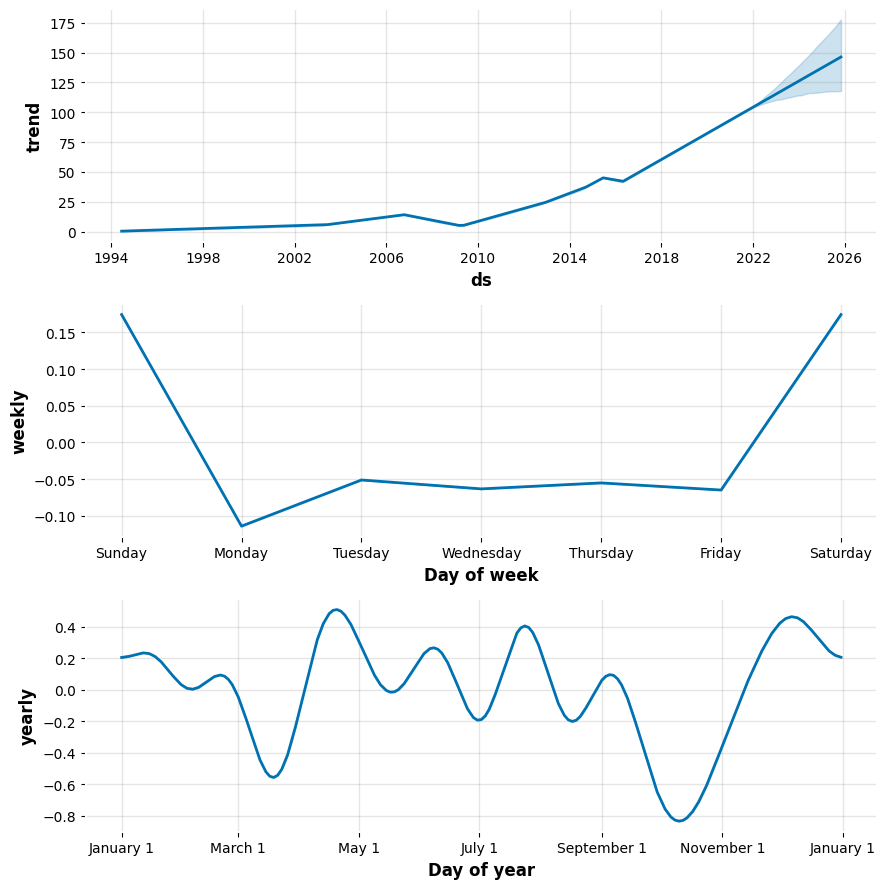

All forecasting done!


In [63]:
plot_close_val(sbux, 'Close', 'sbux') # Plot the Closing Price
fb_prophet_plot(sbux, 'Close', 'sbux')

print("All forecasting done!")

# [9️⃣ Let us do a Forecasting using PyCaret ](#)

In [64]:
try:
    from pycaret.internal.pycaret_experiment import TimeSeriesExperiment
    from pycaret.regression import *
except:
    !pip install pycaret-ts-alpha
    from pycaret.internal.pycaret_experiment import TimeSeriesExperiment
    from pycaret.regression import *

from sktime.utils.plotting import plot_series

     |████████████████████████████████| 520 kB 516 kB/s 
     |████████████████████████████████| 24.2 MB 561 kB/s 
     |████████████████████████████████| 6.5 MB 1.9 MB/s 
     |████████████████████████████████| 114 kB 75.3 MB/s 
     |████████████████████████████████| 1.4 MB 63.9 MB/s 
     |████████████████████████████████| 43 kB 1.4 MB/s 
     |████████████████████████████████| 167 kB 70.8 MB/s 
     |████████████████████████████████| 24.8 MB 815 kB/s 
     |████████████████████████████████| 274 kB 70.0 MB/s 
     |████████████████████████████████| 16.5 MB 63.3 MB/s 
     |████████████████████████████████| 15.7 MB 66.1 MB/s 
     |████████████████████████████████| 58 kB 3.6 MB/s 
     |████████████████████████████████| 79 kB 5.8 MB/s 
  Created wheel for databricks-cli: filename=databricks_cli-0.16.4-py3-none-any.whl size=106877 sha256=bbaf1b1f83337d0506ef1beff5f4bf97d7a2492c6454e5ec04a2b739db7135f9
  Stored in directory: /root/.cache/pip/wheels/a2/a1/6d/fa1d22ea25ed8593887437fe1c7e

In [65]:
sbux_close = sbux[['Close']]
sbux_close.head()

,Close
Date,
1994-06-17,0.764487
1994-06-20,0.735456
1994-06-21,0.729005
1994-06-22,0.729005
1994-06-23,0.690297


In [66]:
sbux_close['MA100'] = sbux_close['Close'].rolling(100).mean()
# plot the sbux_close and MA
sbux_close=sbux_close.reset_index()
sbux_close.head()

,Date,Close,MA100
0,1994-06-17,0.764487,NaN
1,1994-06-20,0.735456,NaN
2,1994-06-21,0.729005,NaN
3,1994-06-22,0.729005,NaN
4,1994-06-23,0.690297,NaN


In [67]:

import plotly.express as px
fig = px.line(sbux_close, x="Date", y=["Close", "MA100"], template = 'simple_white')
fig.show()


In [68]:

# extract month and year from dates
sbux_close['Month'] = [i.month for i in sbux_close['Date']]
sbux_close['Year'] = [i.year for i in sbux_close['Date']]
# create a sequence of numbers
sbux_close['Series'] = np.arange(1,len(sbux_close)+1)
sbux_close.reset_index()
# drop unnecessary columns and re-arrange
sbux_close.drop(['Date' ,'MA100'], axis=1, inplace=True)
sbux_close = sbux_close[['Series', 'Year', 'Month', 'Close']] 
# check the head of the sbux_close
sbux_close.head()

,Series,Year,Month,Close
0,1,1994,6,0.764487
1,2,1994,6,0.735456
2,3,1994,6,0.729005
3,4,1994,6,0.729005
4,5,1994,6,0.690297


In [69]:
import warnings
warnings.filterwarnings('ignore')

data = sbux_close.sample(frac=0.9, random_state=786)
data_unseen = sbux_close.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))
sbux_reg_setup = setup(data = data, target = 'Close', 
                       silent=True, 
                       session_id=123)


,Description,Value
0,session_id,123
1,Target,Close
2,Original Data,"(6181, 4)"
3,Missing Values,False
4,Numeric Features,2
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(4326, 13)"


In [70]:
best_5 = compare_models(n_select = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,0.2630,0.3412,0.5742,0.9996,0.0184,0.0156,0.4860
et,Extra Trees Regressor,0.2483,0.2973,0.5378,0.9996,0.0178,0.0150,0.4230
dt,Decision Tree Regressor,0.2926,0.4009,0.6217,0.9995,0.0209,0.0174,0.0160
xgboost,Extreme Gradient Boosting,0.3180,0.4414,0.6508,0.9994,0.0250,0.0224,14.0230
knn,K Neighbors Regressor,0.3137,0.4589,0.6672,0.9994,0.0204,0.0182,0.0390
catboost,CatBoost Regressor,0.5051,0.8666,0.9263,0.9989,0.0377,0.0358,1.1240
lightgbm,Light Gradient Boosting Machine,0.5366,0.9992,0.9933,0.9987,0.0415,0.0385,0.1180
gbr,Gradient Boosting Regressor,0.6157,1.0780,1.0359,0.9986,0.0613,0.0569,0.0860
ada,AdaBoost Regressor,2.5630,10.7690,3.2558,0.9858,0.4182,0.6613,0.0520
br,Bayesian Ridge,10.7449,204.2878,14.2756,0.7301,0.8610,2.5339,0.0140


In [71]:
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [72]:
print(best_5)

[RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='squared_error',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                      oob_score=False, random_state=123, verbose=0,
                      warm_start=False), ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='squared_error',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_samples_leaf=1, min_samples_split=2,
                    min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                    oob_score=False, random_state=123, verbose=0,
                    warm_start=False), DecisionTreeRegressor(ccp_alpha=0.0, criterion='squa

### ExtraTreesRegressor has the best values for MAE	MSE	RMSE	R2	RMSLE	MAPE values

In [73]:
et = create_model('et', fold = 5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2836,0.4459,0.6678,0.9995,0.0180,0.0155
1,0.2534,0.2938,0.5421,0.9996,0.0180,0.0151
2,0.2342,0.2361,0.4859,0.9996,0.0186,0.0157
3,0.2741,0.3729,0.6107,0.9996,0.0195,0.0162
4,0.2464,0.2314,0.4810,0.9997,0.0192,0.0159
Mean,0.2583,0.3160,0.5575,0.9996,0.0187,0.0157
SD,0.0181,0.0826,0.0724,0.0001,0.0006,0.0003


In [74]:
tuned_et = tune_model(et)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,1.1872,3.2608,1.8058,0.9962,0.1416,0.1439
1,1.2316,3.4417,1.8552,0.9957,0.1446,0.1601
2,1.0667,2.4184,1.5551,0.9965,0.1461,0.1624
3,1.1927,3.0730,1.7530,0.9960,0.1491,0.1588
4,1.1305,2.8055,1.6750,0.9955,0.1520,0.1699
5,1.1016,2.8971,1.7021,0.9958,0.1355,0.1290
6,1.3539,4.1136,2.0282,0.9953,0.1581,0.1737
7,1.2889,3.8821,1.9703,0.9953,0.1449,0.1548
8,1.1451,2.8894,1.6998,0.9960,0.1479,0.1604
9,1.1723,3.0322,1.7413,0.9958,0.1446,0.1554


In [75]:
plot_model(tuned_et, plot = 'parameter')

,Parameters
bootstrap,False
ccp_alpha,0.0
criterion,squared_error
max_depth,None
max_features,auto
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2


In [76]:
bagged_et = ensemble_model(et)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.3184,0.4872,0.6980,0.9994,0.0181,0.0160
1,0.2796,0.4896,0.6997,0.9994,0.0175,0.0147
2,0.2316,0.1882,0.4338,0.9997,0.0182,0.0158
3,0.2890,0.4090,0.6395,0.9995,0.0173,0.0150
4,0.2379,0.2155,0.4642,0.9997,0.0186,0.0161
5,0.2718,0.4040,0.6356,0.9994,0.0206,0.0165
6,0.2920,0.4591,0.6775,0.9995,0.0189,0.0164
7,0.2698,0.3412,0.5841,0.9996,0.0194,0.0157
8,0.2595,0.2973,0.5453,0.9996,0.0194,0.0163
9,0.2579,0.2692,0.5189,0.9996,0.0199,0.0171


In [77]:
boosted_et = ensemble_model(et, method = 'Boosting')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2968,0.4229,0.6503,0.9995,0.0177,0.0155
1,0.2630,0.4602,0.6784,0.9994,0.0176,0.0146
2,0.2088,0.1422,0.3771,0.9998,0.0179,0.0156
3,0.2676,0.3694,0.6078,0.9995,0.0172,0.0148
4,0.2304,0.2048,0.4525,0.9997,0.0195,0.0168
5,0.2384,0.2611,0.5110,0.9996,0.0204,0.0161
6,0.2665,0.3657,0.6048,0.9996,0.0185,0.0162
7,0.2619,0.3127,0.5592,0.9996,0.0191,0.0156
8,0.2378,0.2346,0.4843,0.9997,0.0193,0.0167
9,0.2428,0.2169,0.4657,0.9997,0.0194,0.0167


In [78]:
# generate predictions on the original sbux_close
predictions = predict_model(boosted_et, data=sbux_close)
# add a date column in the sbux_close
#predictions['Date'] = pd.date_range(start='1994-06-17', end = '2021-09-30')
# line plot

print(predictions.head())

fig = px.line(predictions, x='Series', y=["Close", "Label"], template = 'simple_white')
# add a vertical rectange for test-set separation
fig.add_vrect(x0=predictions.Series.max()-500, x1=predictions.Series.max(), fillcolor="grey", opacity=0.25, line_width=0)
fig.show()


   Series  Year  Month     Close     Label
0       1  1994      6  0.764487  0.729005
1       2  1994      6  0.735456  0.729005
2       3  1994      6  0.729005  0.729005
3       4  1994      6  0.729005  0.729005
4       5  1994      6  0.690297  0.690297


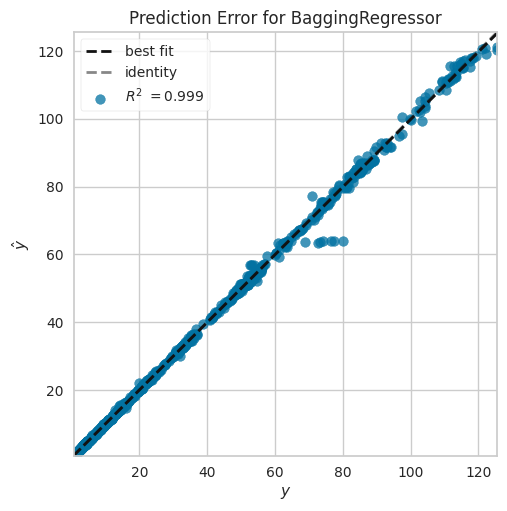

In [79]:
plot_model(bagged_et, plot = 'error')


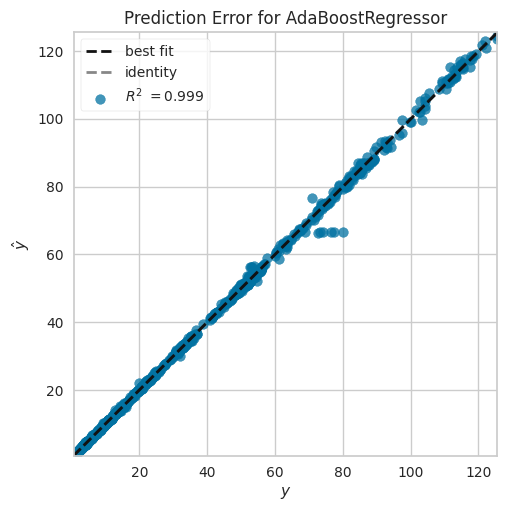

In [80]:
plot_model(boosted_et, plot = 'error')


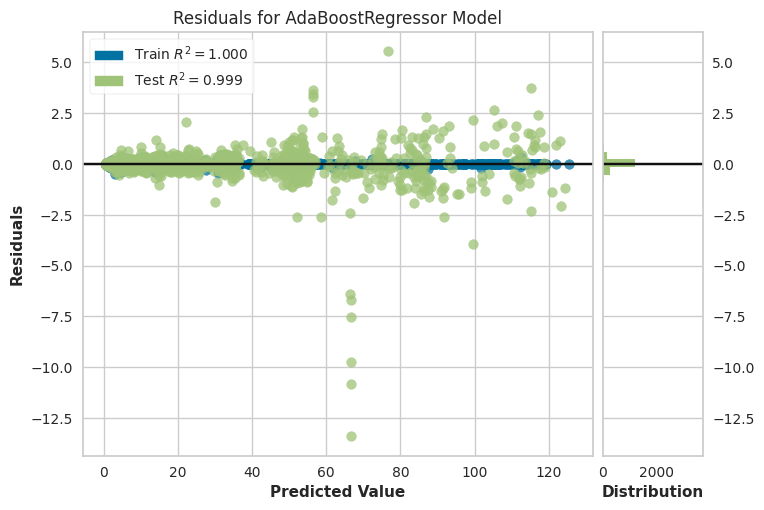

In [81]:
plot_model(boosted_et)


In [82]:
saved_final = save_model(boosted_et,'Final Boosted ET Model Starbucks')

Transformation Pipeline and Model Successfully Saved


In [83]:
# THIS IS A WORK IN PROGRESS 